# Udacity Data Science Capstone Project: MLI implementation with Credit Risk data

In [1]:
# Import Libraries
import pandas as pd  # Dataframe object manipulation
import numpy as np  # Array operations
import seaborn as sns  # Plots
import matplotlib.pyplot as plt  # Plotting
import pandas_profiling  # Data exploration

# Modelling
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score
from sklearn.metrics import plot_roc_curve
from sklearn.pipeline import Pipeline
from sklearn import preprocessing
from matplotlib import pyplot

# MLI
import lime
import lime.lime_tabular


## 1 . Analysis

***

The goal for this following section is for the reader to become familiar with the dataset we are working with plus potential pitfalls in the data we might need to address.
### Data Exploration


In [2]:
# Read in the Dataset.
# Import file should be located on project folder
path = 'cs-training.csv'
data = pd.read_csv(path,
                  usecols = ['SeriousDlqin2yrs',
                             'RevolvingUtilizationOfUnsecuredLines',
                             'age',
                             'NumberOfTime30-59DaysPastDueNotWorse',
                             'DebtRatio',
                             'MonthlyIncome',
                             'NumberOfOpenCreditLinesAndLoans',
                             'NumberOfTimes90DaysLate',
                             'NumberRealEstateLoansOrLines',
                             'NumberOfTime60-89DaysPastDueNotWorse',
                             'NumberOfDependents'])

Exploration of a dataset is paramount to a correct framing of our problem. Out objective is to predict an event of serious delinquency in the next 2 years based on 10 variables. In order to really understand our data and the vastness of the problem at hand we will focus on the next steps:

* Dimensions of the dataset
* Descriptive stats + Probability distribution plots
* Nan Detection
* Outlier Detection + Box plots
* Correlation Matrix
* Model Constraints from data related problems
* Possible candidates of features


#### Dimensions and Descriptive stats

The Give Me Some Credit dataset has a recollection of important features regarding the potential credit risk of the Client. We have a total of 150.000 different clients available to user in our training excercise. The feature space for each client ranges from financial standing features, financial status to demographic.  

Descriptive statistics of the dataset are as follows


In [3]:
# Standard pd description
(data.describe())

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
count,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,1.202690e+05,150000.000000,150000.000000,150000.000000,150000.000000,146076.000000
mean,0.066840,6.048438,52.295207,0.421033,353.005076,6.670221e+03,8.452760,0.265973,1.018240,0.240387,0.757222
std,0.249746,249.755371,14.771866,4.192781,2037.818523,1.438467e+04,5.145951,4.169304,1.129771,4.155179,1.115086
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.029867,41.000000,0.000000,0.175074,3.400000e+03,5.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.154181,52.000000,0.000000,0.366508,5.400000e+03,8.000000,0.000000,1.000000,0.000000,0.000000
75%,0.000000,0.559046,63.000000,0.000000,0.868254,8.249000e+03,11.000000,0.000000,2.000000,0.000000,1.000000
max,1.000000,50708.000000,109.000000,98.000000,329664.000000,3.008750e+06,58.000000,98.000000,54.000000,98.000000,20.000000


In [4]:
# PD.describe is a little lackluster
data.profile_report()

The Give Me Some credit competition support team kindly offered a dictionary for this dataset that is summarized for reader support
- **SeriousDlqin2yrs [int] :** Person Experienced 90 days past due delinquency or worse
- **RevolvingUtilizationOfUnsecuredLines [float] :** Total balance on credit cards and personal lines of credit, divided by the sum of credit limits
- **Age [int]:** Age borrower in years
- **NumberOfTime30-59DaysPastDueNotWorse [int]:** Number of times the borrower has been 30-59 days past due but not worse in the last 2 years
- **DebtRatio [float]:** Monthly debt payments, alimony, living costs divided by monthly gross income
- **MonthlyIncome [float]:** Monthly Income of customer
- **NumberOfOpenCreditLinesAndLoans [int]:** Number of Open oans (installments like car loan or mortgage) and Lines of Credit
- **NumberOfTimes90DaysLate [int]:** Number of times borrower has been 90 days or more past due.
- **NumberRealEstateLoansOrLines [int]:** Number of mortgage and real estate loans including home equity lines of credit
- **NumberOfTime60-89DaysPastDueNotWorse [int]:** Number of times borrower has been 60-89 days past due but not worse in the last 2 years
- **NumberOfDependents [int]:** Number of dependents in family excluding themselves.

Regarding theoretical limits for variables, Utilization cannot be negative (unless overdraft). High Debt to Income Ratios should not be processed as outliers, when income becomes 0 debt to income limit approaches infinity. Negative incomes are data errors, possible outliers regarding demographic data

### Data Visualization
We will start visualization plots always taking into account our target feature: Loan Default in the next 2 years, as it is a part of a bank livelihood, credit default rates should be consistently imbalanced.

We have a total of 6.6% of the 150k population that has incurred in serious default events in two years. Given the nature of the feature and the dataframe I suspect this information is collected from a Mortgage portfolio. 

The distribution of the target feature is presented as follows:

In [35]:
# Count values for Target feature
pd.DataFrame(data['SeriousDlqin2yrs'].value_counts(normalize=True))

,SeriousDlqin2yrs
0,0.93316
1,0.06684


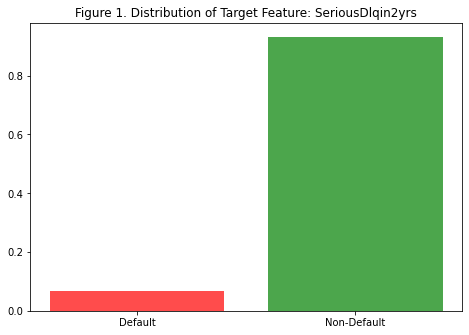

In [6]:
# Histogram plot for target feature

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
labels = ['Default', 'Non-Default']  # Predicted Classes, default point may vary regarding local regulations
values = [(data[data['SeriousDlqin2yrs']==1].sum()['SeriousDlqin2yrs'])/150000, (150000-data[data['SeriousDlqin2yrs']==1].sum()['SeriousDlqin2yrs'])/150000]  # Normalized by lenght of data 150.000
ax.bar(labels,values, color= ['red', 'green'], alpha=0.7)
plt.title('Figure 1. Distribution of Target Feature: SeriousDlqin2yrs')
plt.show()

As part of Portfolio theory, the goal of a risk manager is to select the optimal return for the associated risk on the investment. The bank provides loan applicants with the funds required for an especific purpose and in return it gets the interest on the money lent.[0]


A correct measurement of risk allows the bank to maximize its returns with an expected level of delinquency on its loans the goal of our model is to predict as accurate as possible this suggested level of delinquency in the next two years.

In addition to the target feature analysis, we provide expected signs for our feature space as well as visualizations for each feature in Annex(A).CreditDefaultEDA

The results from our EDA analysis are summarized on this table. All of this results come from a main question: **What worries me about this feature?**

| Feature Name                         	| Expected Sign 	| Outlier Problems 	| Data Problems                               	|
|--------------------------------------	|---------------	|------------------	|---------------------------------------------	|
| SeriousDlqin2yrs                     	|       NA      	|        NA        	| Unbalanced                                  	|
| RevolvingUtilizationOfUnsecuredLines 	|       -       	|        NA        	| Values > 1 suggest problems. Informative    	|
| Age                                  	|       +       	|        NA        	| Remove underage population                  	|
| NumberOfTime30-59DaysPastDueNotWorse 	|       -       	|        NA        	| Nan Treatment, encode Values                	|
| DebtRatio                            	|       -       	|        NA        	| NaN not associated to default, non reliable 	|
| MonthlyIncome                        	|       +       	|        NA        	| NaN treatment, standarize                   	|
| NumberOfOpenCreditLinesAndLoans      	|       -       	|     Cap at 10    	| Standarize                                  	|
| NumberOfTimes90DaysLate              	|       -       	|                  	| Encode, Relevant feature, possible leak     	|
| NumberRealEstateLoansOrLines         	|       +       	|                  	|                                             	|
| NumberOfTime60-89DaysPastDueNotWorse 	|       -       	|                  	| Encode                                      	|
| NumberOfDependents                   	|       -       	|                  	|                                             	|

The logic behind expected signs is as follows. Users in financial distress tend to start using their available resources to cover the leak in their financial distress. A high utilization at high rates suggest a troublesome set.For example, A low level of liquidity, low financial knowledge sophistication ( Highest borrowing rates in the market) or non expected financial windfall, among others.  

> As Warren buffet once said: " You cannot go through life borrowing at those rates" [1]

The logic behind age comes from dynamic Macroeconomic theory and the financial lifecycle. We expect (segregated by income) a Solow's type of income stock (Savings) were the bulk of the individual's life expenditure diminishes as life progresses,and income grows until it becomes static at retirement. [2]


Debt to income ratios suggest how much the incurred loans from the client are a burden to its day to day life, accurate income measuring its a problem in itself but when a client report 0 income to the bank, it is in the bank's best interest to offer reestructuring facilities to weather the crisis to a client. [3]

In practice however, a low debt to income ratio paradoxically has been reported to be associated to a decrease in payment rates as well. Small amounts of debt seem to easily escape the to-do list of high income segments of population.



Regarding Past-due Events our logic relies on Merton's modelling for financial assets. The closest you have been to default should weight on how likely you are to default in the future. Or, the standard deviation from expected returns should be priced proportionally to the expected return. A simple but elegant solution to asset pricing. [4]

This type of analysis are not possible on high dimensional feature spaces but from time to time, this low dimentional feature spaces give way for some leniency on the effect of theory on the expected results from our model

## 2. Methodology

***

### Data Preprocessing
As part of our preprocessing techniques we will: 


- Windsorize outliers according to bins defined by IQR
- Encode Missing Values

#### Null treatment

Identify clear Nan Values, replace with median. Median preferred due to robustness on data, and feasible value. The current state of missing values on the training set is displayed in the table below

In [7]:
pd.DataFrame(data.isna().sum(), columns = ['Missing Values']) # Diagnose Dataframe for missing values

,Missing Values
SeriousDlqin2yrs,0
RevolvingUtilizationOfUnsecuredLines,0
age,0
NumberOfTime30-59DaysPastDueNotWorse,0
DebtRatio,0
MonthlyIncome,29731
NumberOfOpenCreditLinesAndLoans,0
NumberOfTimes90DaysLate,0
NumberRealEstateLoansOrLines,0
NumberOfTime60-89DaysPastDueNotWorse,0


In [8]:
# Create Boolean Features
data['MonthlyIncome_na'] = data['MonthlyIncome'].isna()
data['NumberOfDependents_na'] = data['MonthlyIncome'].isna()

# Input median on problem features
data['MonthlyIncome'] = data['MonthlyIncome'].fillna(data['MonthlyIncome'].median())
data['NumberOfDependents'] = data['NumberOfDependents'].fillna(data['NumberOfDependents'].median())

# Check data
pd.DataFrame(data.isna().sum(), columns=['Missing Values'])

,Missing Values
SeriousDlqin2yrs,0
RevolvingUtilizationOfUnsecuredLines,0
age,0
NumberOfTime30-59DaysPastDueNotWorse,0
DebtRatio,0
MonthlyIncome,0
NumberOfOpenCreditLinesAndLoans,0
NumberOfTimes90DaysLate,0
NumberRealEstateLoansOrLines,0
NumberOfTime60-89DaysPastDueNotWorse,0


#### Outlier treatment
As part of outlier treatment of variables we will clip outliers according to the interquartile range of the population

- **RevolvingUtilizationOfUnsecuredLines:** [0, 0.029867442, 0.154180737, 0.5590462475, 1.35281445575, 2.146582664, inf]
- **Age:** [0, 18, 20, 41, 52, 63, 80, 93, float('Inf')] 
- **NumberOfTime30-59DaysPastDueNotWorse:** [0, 0.99, 1, 2, 4, 6, 10, 13, float('Inf')]
- **DebtRatio:** [-inf, -1.9044659907499997, -0.8646960792499998, 0.17507383225, 0.366507841, 0.86825377325, 1.9080236847499998, 2.9477935962499995, inf]
- **MonthlyIncome:** [float('-Inf'), 0, 3400, 5400, 8000, 10000, 15000, 20000, 23000, float('Inf')]
- **NumberOfOpenCreditLinesAndLoans**: [float('-inf'), 0, 5, 8, 11, 20, 29, float('inf')]
- **NumberOfTimes90DaysLate:** [float('-inf'), 0, 1, 2, 3, 8, 10, float('inf')]
- **NumberOfTime60-89DaysPastDueNotWorse:** bins = [float('-inf'), 0, 1, 2, 3, float('inf')]

In [9]:
# Encode Outliers using plot above
data['RevolvingUtilizationOfUnsecuredLines_out'] = np.where(data['RevolvingUtilizationOfUnsecuredLines']>=2.14, 1, 0)
data['age_out'] = np.where(data['age'] >= 90, 1, 0)
data['NumberOfTime30-59DaysPastDueNotWorse_out'] = np.where(data['NumberOfTime30-59DaysPastDueNotWorse'] > 13, 1, 0)
data['DebtRatio_out'] = np.where(data['DebtRatio'] > 2.94, 1, 0)
data['MonthlyIncome_out'] = np.where(data['MonthlyIncome'] > 23000, 1, 0)
data['NumberOfOpenCreditLinesAndLoans_out'] = np.where(data['NumberOfOpenCreditLinesAndLoans'] > 20, 1, 0)
data['NumberOfTimes90DaysLate_out'] = np.where(data['NumberOfTimes90DaysLate'] > 10, 1, 0)
data['NumberOfTime60-89DaysPastDueNotWorse_out'] = np.where(data['NumberOfTime60-89DaysPastDueNotWorse'] > 3, 1, 0)


After preprocessing the integrity of the information holds. No records were omitted during the cleaning process, just adjusting outliers to max values inside each feature distribution

### Implementation 
The first approach towards model creation will be with a random Forest Classifier with the standard parameters assigned by scikit-learn.A Train/Test split at 70% of the population is defined to avoid overfitting. The model should optimize for classification metrics such as AUC, or the components of the F1-Score.


In [10]:
# Target and Feature creation
X = data[['RevolvingUtilizationOfUnsecuredLines',
          'age',
          'NumberOfTime30-59DaysPastDueNotWorse',
          'DebtRatio',
          'MonthlyIncome',
          'NumberOfOpenCreditLinesAndLoans',
          'NumberOfTimes90DaysLate',
          'NumberOfTime60-89DaysPastDueNotWorse',
          'NumberOfDependents'

          ]]
y = data['SeriousDlqin2yrs']
# Split the dataset between train and test, 0.30 split used, 42 for consistency (And tradition)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .30, random_state=42)

In [11]:
# Memory consumed by train dataframe
mem = X_train.memory_usage(index=True).sum()
print("Memory consumed by training set  :   {} MB" .format(mem/ 1024**2))
print('\n') 
# Memory consumed by test dataframe
mem = X_test.memory_usage(index=True).sum()
print("Memory consumed by test set      :   {} MB" .format(mem/ 1024**2))

Memory consumed by training set  :   8.0108642578125 MB


Memory consumed by test set      :   3.4332275390625 MB


Before training our models, a quick memory sanity check is in order. The split for the training set consumes 8MB, and the Test split 3.43MB. Given the order of complexity of the models to be used, no memory shortage realted problems should arise.

Now, regarding the model, we will train a industry scikit-learn standard parameters model. More information available at https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
- RandomForestClassifier(random_state=42)
	- bootstrap': True
	- ccp_alpha': 0.0
	- class_weight': None
	- criterion': 'gini'
	- max_depth': None
	- max_features': 'auto'
	- max_leaf_nodes': None
	- max_samples': None
	- min_impurity_decrease': 0.0
	- min_impurity_split': None
	- min_samples_leaf': 1
	- min_samples_split': 2
	- min_weight_fraction_leaf': 0.0
	- n_estimators': 100
	- n_jobs': None
	- oob_score': False
	- random_state': 42
	- verbose': 0
	- warm_start': False

A pipeline object is defined in case further preprocessing techniques should arise in the future. The reported AUC score regarding this model is 0.8405 the confusion matrix is displayed below

In [12]:
# Pipeline object defined if further preprocessing should be added
pipeline = Pipeline([
    ('classifier', RandomForestClassifier(random_state = 42))])

pipeline.fit(X_train, y_train)

Pipeline(steps=[('classifier', RandomForestClassifier(random_state=42))])

In [13]:
# Model training
preds = pipeline.predict(X_test)
np.mean(preds == y_test)  # Accuracy

# Accuracy report
accuracy_score(preds, y_test)
print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97     42020
           1       0.55      0.19      0.28      2980

    accuracy                           0.94     45000
   macro avg       0.75      0.59      0.62     45000
weighted avg       0.92      0.94      0.92     45000



In [14]:
print('AUC Score of: ', roc_auc_score(y_test, pipeline.predict_proba(X_test)[:,1]))

AUC Score of:  0.8405431497944412


### Refinement
We implement GridSearch cross validation as implemented on Sklearn.model_selection, the chosen grid of hyperparameters are defined as follows:
 - n_estimators: [20, 30, 50]
 - max_depth: [2, 4]
 - min_samples_leaf': [2, 4]
 The best parameter combination after validation is Depth of 4, n_estimators of 20 and min_sample_lead of 4

Even a small change upon the standard chosen hyperparameters help in the classification metrics as it can be seen on the ROC plot below.

In [15]:
# Cross validation grid definition
hyperparameters = {  'classifier__n_estimators': [20, 30, 50],
                    'classifier__max_depth': [2, 4],
                    'classifier__min_samples_leaf': [2, 4]}
# CV train
clf = GridSearchCV(pipeline, hyperparameters, cv = 3)
 
# Fit and tune model
clf.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('classifier',
                                        RandomForestClassifier(random_state=42))]),
             param_grid={'classifier__max_depth': [2, 4],
                         'classifier__min_samples_leaf': [2, 4],
                         'classifier__n_estimators': [20, 30, 50]})

In [16]:
# Model testing with CV model
preds = clf.predict(X_test)
np.mean(preds == y_test)  # Accuracy prediction

0.9365111111111111

Text(0.5, 0.98, 'ROC curve comparison')

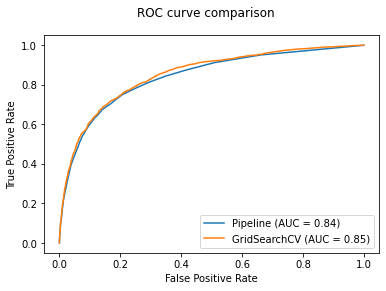

In [17]:
# Roc curve comparison between models
rfc_no_cv = plot_roc_curve(pipeline, X_test, y_test)  # Standard sk-learn RF model
rfc_cv    = plot_roc_curve(clf, X_test, y_test, ax=rfc_no_cv.ax_) # CV model

rfc_cv.figure_.suptitle("ROC curve comparison")

The now refined model displays better AUC.

In [18]:
# Classification report for CV model
print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       0.94      1.00      0.97     42020
           1       0.61      0.11      0.19      2980

    accuracy                           0.94     45000
   macro avg       0.78      0.55      0.58     45000
weighted avg       0.92      0.94      0.92     45000



## Results 

***

### Model Evaluation and Validation
The model parameters are not the main objective of this article, nonetheless, the model displays a precision of 0.94 across the test set, with areas under the receiving operator curve of 0.85.

The relatively low f1 score relies entirely on the use-case. If this model is used entirely for accepting/rejecting loans, extreme care should be taken of not excluding a large percentage of the candidate population.

A common approach at explaining the results of a non-linear model, relies on plotting the Variable Importance for the whole population we will follow but also expand on the caveats of this approach.

In [19]:
# Feature importance of non cv model
pipeline.steps[0][1].feature_importances_

array([0.20113305, 0.12907334, 0.0500696 , 0.19168624, 0.15358756,
       0.09010525, 0.08997704, 0.05159679, 0.04277114])

In [20]:
# Feature importance of CV model example of how to use model results within a CV/pipeline environment
clf.best_estimator_.steps[0][1].feature_importances_

array([0.18629317, 0.01998433, 0.14254297, 0.00563108, 0.00333057,
       0.00698334, 0.36004074, 0.27470008, 0.00049371])

No handles with labels found to put in legend.


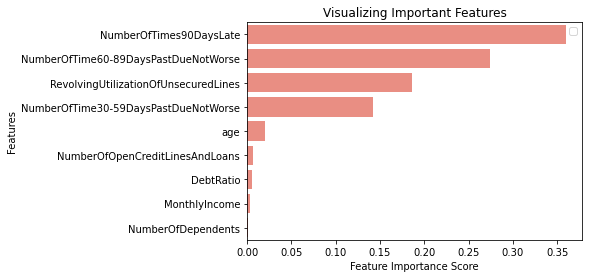

In [21]:
# Feature importance of CV model for plotting
feature_imp = pd.Series(clf.best_estimator_.steps[0][1].feature_importances_,index=X.columns).sort_values(ascending=False)

# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index, color="salmon")

# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

Altough variable Importance shows us an important insight, regulators require granularity regarding client offerings/refusals. In order to comply to the most strict regulations we need to be able to provide reason codes for each client refused by the bank. Lets take the worst top 10 predicted probabilities on our test set.

In [22]:
# Worst ids, predict proba loses the index for client
print(pd.DataFrame(clf.predict_proba(X_test)).head(5))
type(X_test)

          0         1
0  0.980796  0.019204
1  0.979375  0.020625
2  0.974721  0.025279
3  0.912757  0.087243
4  0.914019  0.085981


pandas.core.frame.DataFrame

In [23]:
# Find the index of the worst predicted probabilities
X_test_prob_df = pd.DataFrame(clf.predict_proba(X_test))  # Worst probability clients ordered only by input not user_id
X_test_df = X_test.reset_index()  # Reset index to join de data with only order and not user index

In [24]:
X_test_merge = X_test_df.merge(X_test_prob_df, left_index=True, right_index = True)  # Retrieve the probabilities for each client

In [25]:
# Top 10 worst predicted clients in test dataframe
top10_worst_clients = X_test_merge.sort_values(by=1, ascending = False).head(10)
top10_worst_clients

,index,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,0,1
41750,69189,1.224775,37,4,1921.000000,5400.0,9,2,3,0.0,0.353131,0.646869
42136,59128,1.636430,41,3,0.651415,3780.0,6,3,3,3.0,0.361929,0.638071
42231,62640,1.279819,61,4,921.000000,5400.0,11,3,1,0.0,0.364341,0.635659
30796,113042,1.260924,47,2,3512.000000,5400.0,5,3,1,0.0,0.365426,0.634574
43287,42081,1.173509,33,3,0.430443,5570.0,13,5,2,2.0,0.365590,0.634410
5392,43443,1.255814,42,3,0.477626,3083.0,6,3,2,3.0,0.372490,0.627510
24984,4081,1.201452,57,2,1906.000000,5400.0,9,4,1,0.0,0.373919,0.626081
19060,140025,1.161119,52,4,0.581637,2308.0,7,2,1,3.0,0.375208,0.624792
451,18633,1.671105,52,3,0.513251,4527.0,8,3,1,4.0,0.375208,0.624792
13749,118412,1.074221,47,2,3.354767,450.0,8,2,1,2.0,0.375578,0.624422


# Lime implementation

In [28]:
# Setup
predict_fn_rf = lambda x: clf.predict_proba(x).astype(float)  # Function to retrieve record probabilities
X = X_train.values  # Array of train dataframe
explainer = lime.lime_tabular.LimeTabularExplainer(X,feature_names = X_train.columns,class_names=[0,1],kernel_width=5)  # Model explainer initialization

In [29]:
# Worst predicted client id
y_test.loc[[69189]]

69189    1
Name: SeriousDlqin2yrs, dtype: int64

In [30]:
# Applying the explainer to this client and show results
choosen_instance = X_test.loc[[69189]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=10)

In [31]:
exp.show_in_notebook(show_all=False)

In [32]:
# Applying the explainer to this client and show results 
choosen_instance = X_test.loc[[59128]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=10)
exp.show_in_notebook(show_all=False)

In [33]:
# Applying the explainer to this client and show results
choosen_instance = X_test.loc[[62640]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=10)
exp.show_in_notebook(show_all=False)

In [34]:
# Applying the explainer to this client and show results
choosen_instance = X_test.loc[[42081]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=10)
exp.show_in_notebook(show_all=False)

### Justification
As it has been observed, variable importance on classifiers is just not enough for the level of granularity required to convince regulators and managers of the benefits of using ML techniques in Credit Risk. 

This has been a small example that an accurate, fully explained model is possible, under current economic/Finance theory and by explaining client by client the reasoning of the coded model, the benefits and potential insights across all of the studied population are inmense. 

The benefits of using non-linear approaches to find clusters of explainable phenomena across a banks portfolio are exactly what is needed now in times of distress and global economic recovery.

## Conclusion

***
### Reflection
To recapitulate what we've done we:
- Used relevant Credit Risk data from a global competition
- Explored, and processed the data
- Trained a Random Forest classifier and then iterated to find the best parameters
- Displayed Variable Importance for the results
- Implemented a Machine Learning Interpretability technique to fully explain the effect of each feature on the predicted probability using LIME

The latest part seemed the most difficult. LIME is still on its early releases, it is still not fully scalable and the GUI elements from the explainer are still a bit unflexible but the power of explaining at the record level is indeed impressive.


### Improvement
There are some caveats at linearizing the probability space across the joint distributions, the explanations are only as good as the model linearization is. Further research on the algorithm is still needed to fully scale the results for the tens of thousands of applications any small bank receives  per day. 

The H2O solution for these problems was the developement of K-Lime. Displaying the results of the R^2 for each cluster linearization. Other (also non scalable) technique for MLI is the use of Shapley Values, a game theoretical approach in finding the contribution of each feature to the added predicted probability.

Further improvements to be done on this implementation could be regarding the preprocessing pipeline. Feature Engineering (As long as it doesn't break interpretability) and a more extensive CV search across all possible and recurrent best parameters for classification techniques.

### References 
[0] https://www.investopedia.com/terms/m/modernportfoliotheory.asp  
[1] https://www.cnbc.com/2020/05/13/warren-buffett-cautions-against-carrying-a-credit-card-balance.html#:~:text=%E2%80%9CYou%20can't%20go%20through,pay%20down%20debt%2C%20the%20better.&text=And%20once%20you're%20debt,have%20to%20owe%20interest%20again    
[2]  Swan, Trevor W. (November 1956). "Economic growth and capital accumulation". Economic Record. 32 (2): 334–361  
[3] https://www.investopedia.com/terms/d/debtrestructuring.asp#:~:text=Debt%20restructuring%20is%20a%20process,a%20default%20on%20sovereign%20debt.